In [1]:
from datetime import datetime

from astropy.io import fits,ascii
from astropy.table import Table,QTable
from astropy.visualization import simple_norm
import matplotlib.axes as axes
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from photutils.aperture import EllipticalAperture
from photutils.isophote import Ellipse,EllipseGeometry


import warnings
warnings.filterwarnings("ignore")

In [2]:
time_ini = datetime.now()

In [3]:
#imported data directories:
data_dir=f'results/data_sample/'
cuts_dir=f'results/make_postage_stamps/F200W/'
cuts_dir_2=f'results/make_postage_stamps/F444W/'

#results saved in directory:
res_dir=f'results/morphology/'

# 1. Visual classification:

For visualization purposes, we're using a logarithmic normalization (log_a=70). The full description of the funcion LogStretch and its parameters can be found in https://docs.astropy.org/en/stable/api/astropy.visualization.LogStretch.html#logstretch ; here, it's enough to say that the parameter log_a in a stretch/transformation $x\rightarrow y$ is given by: $y=\frac{\log(ax+1)}{\log(a+1)}$

## 1.1. Creating the sample:

We now import the data sample that will be analyzed, located in data_dir. 

In [4]:
table=data_dir+f'data_sample_table_z-3-4.ecsv'
data_sample = ascii.read(table) 

We create a new table with only the relevant information on the galaxies (ID, RA, DEC, z, effective radius in F200W and F444W filters). Then we order it by redshift.

In [5]:
gal_id=[]
ra=[]
dec=[]
z=[]
ref_200=[]
ref_444=[]

for i in range(len(data_sample)):
    gal_id.append(data_sample['ID'][i])
    ra.append(data_sample['RA'][i])
    dec.append(data_sample['DEC'][i])
    z.append(data_sample['z'][i])
    ref_200.append(data_sample['Re_F200W'][i].value)
    ref_444.append(data_sample['Re_F444W'][i].value)

table=QTable()
table['ID']=gal_id
table['RA']=ra
table['DEC']=dec
table['z']=z
table['Re_F200W']=ref_200
table['Re_F444W']=ref_444

table_final=table[np.argsort(table['z'])]

In [6]:
#table with all galaxies ID and questions for visual classification:
#0=NO, 1=YES

#table:
table_excel=Table()
table_excel['Galaxy ID']=table_final['ID']
table_excel['Is it elliptical?']=0
table_excel['Is it a disk?']=0
table_excel['Is it irregular?']=0
table_excel['Is it unresolved?']=0
table_excel['Does it have a bar?']=0
table_excel['Is the morphology different between both bands?']=0

data_frame=table_excel.to_pandas()
data_frame.to_excel(res_dir+'visual_classification.xlsx', index=False)

In [7]:
cuts=[]
for i in range(len(table_final['ID'])):
    file_id=table_final['ID'][i]
    cuts.append(f'{file_id}_cutout.fits')

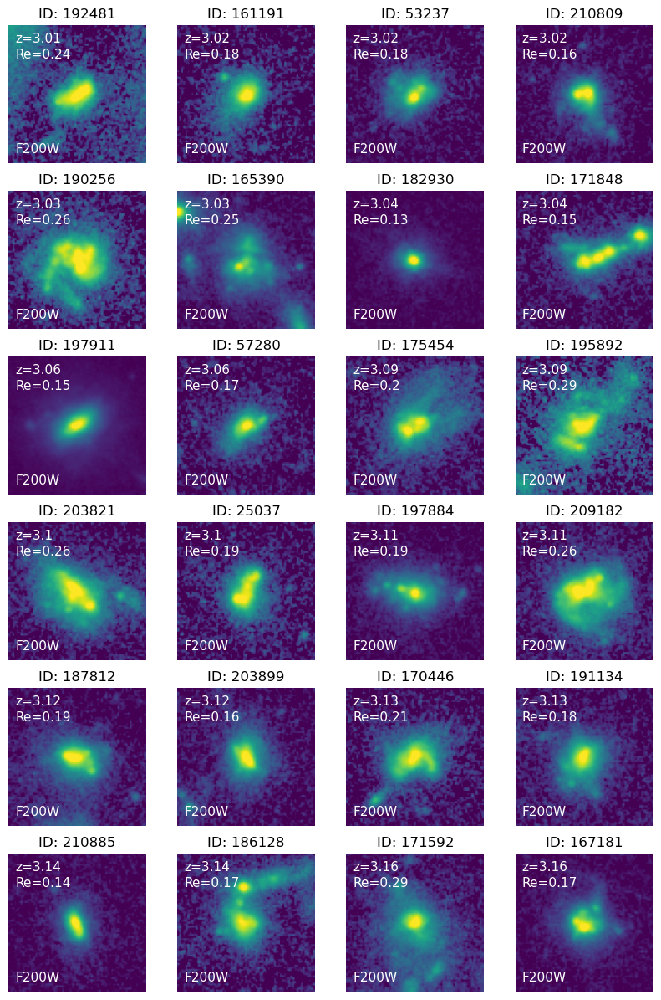

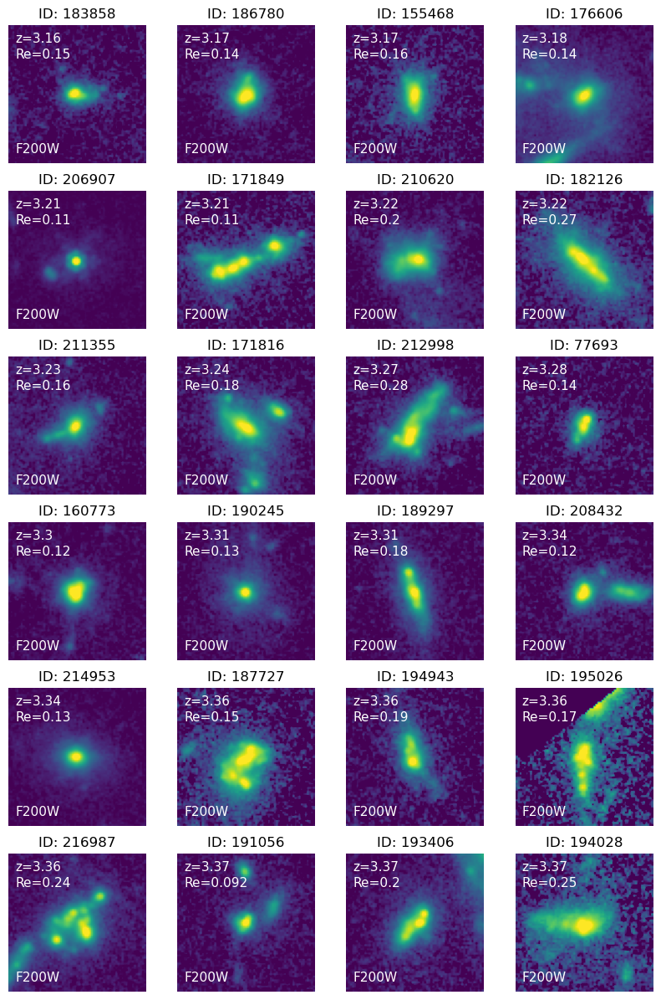

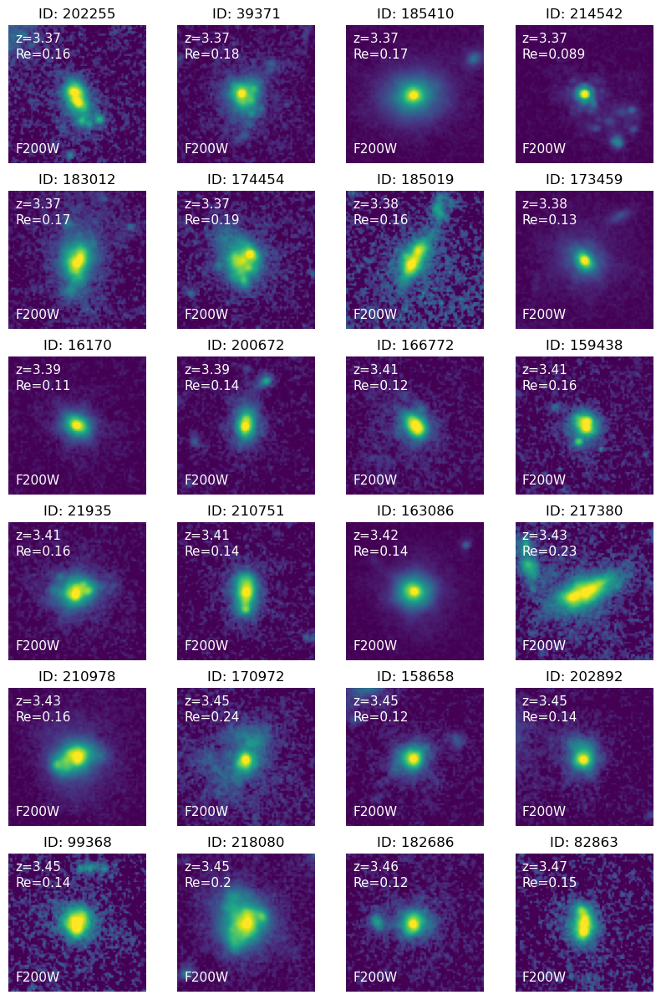

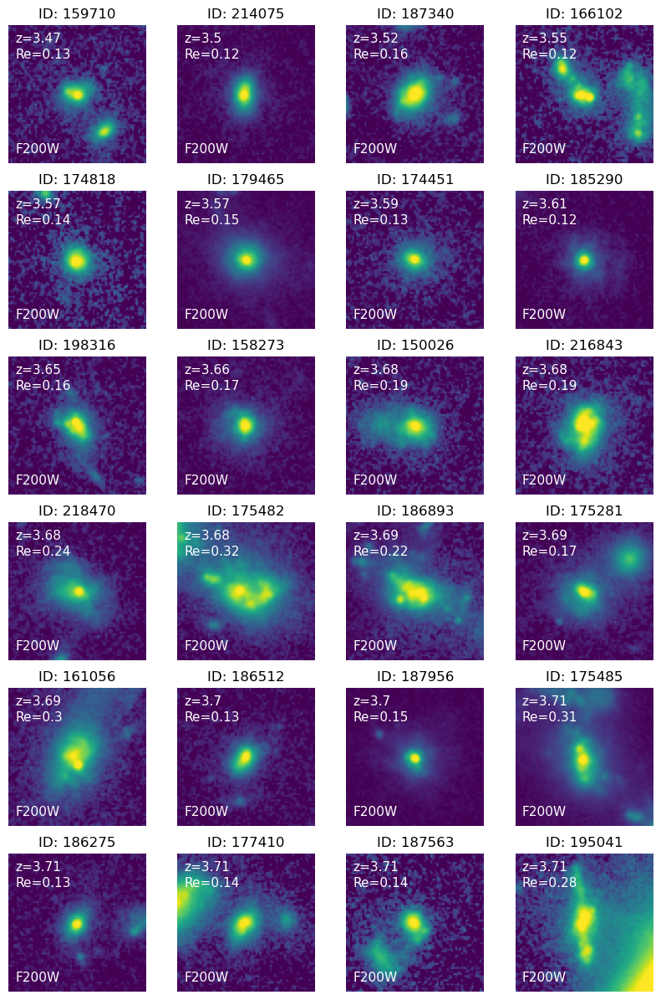

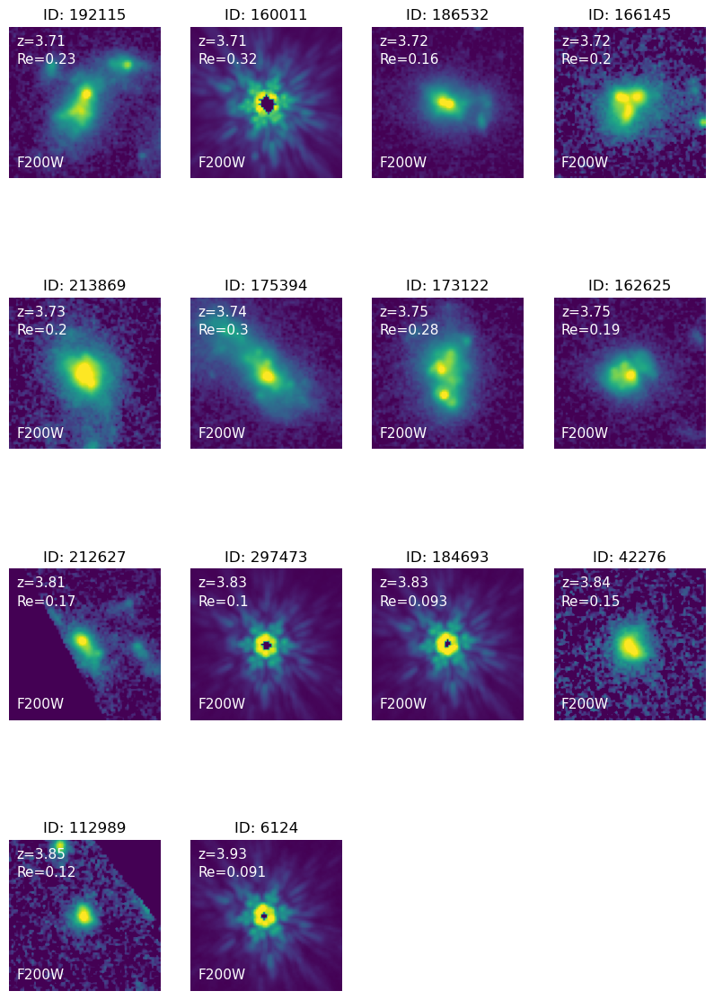

In [8]:
it=0

with PdfPages(res_dir+f'gal_cutouts_F200W.pdf') as pdf:
    
    fig=plt.figure(figsize=(10,15))
    n=0
    
    for file in cuts[0:24]:
        n=n+1
        ax = fig.add_subplot(6,4,n)
        
        #data from file:
        image=cuts_dir+f"{file}"
        hdu_image=fits.open(image)
    
        #data to put in text:
        rs=table_final['z'][it]
        r=table_final['Re_F200W'][it]
        gid=table_final['ID'][it]

        #normalization of data:
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=11, color='white')
        ax.text(0.05, 0.95, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.83, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.15, f'F200W', transform=ax.transAxes, **text_kwargs)

        it=it+1

    pdf.savefig(bbox_inches="tight")
    
    n=0
    fig=plt.figure(figsize=(10,15))
    for file in cuts[24:48]:
    
        n=n+1
        ax = fig.add_subplot(6,4,n)
        
        #data from file:
        image=cuts_dir+f"{file}"
        hdu_image=fits.open(image)
    
        #data to put in text:
        rs=table_final['z'][it]
        r=table_final['Re_F200W'][it]
        gid=table_final['ID'][it]

        #normalization of data:
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=11, color='white')
        ax.text(0.05, 0.95, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.83, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.15, f'F200W', transform=ax.transAxes, **text_kwargs)
        
        it=it+1
    
    pdf.savefig(bbox_inches="tight")

    n=0
    fig=plt.figure(figsize=(10,15))
    for file in cuts[48:72]:
    
        n=n+1
        ax = fig.add_subplot(6,4,n)
        
        #data from file:
        image=cuts_dir+f"{file}"
        hdu_image=fits.open(image)
    
        #data to put in text:
        rs=table_final['z'][it]
        r=table_final['Re_F200W'][it]
        gid=table_final['ID'][it]

        #normalization of data:
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=11, color='white')
        ax.text(0.05, 0.95, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.83, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.15, f'F200W', transform=ax.transAxes, **text_kwargs)
        
        it=it+1
    
    pdf.savefig(bbox_inches="tight")

    n=0
    fig=plt.figure(figsize=(10,15))
    for file in cuts[72:96]:
    
        n=n+1
        ax = fig.add_subplot(6,4,n)
        
        #data from file:
        image=cuts_dir+f"{file}"
        hdu_image=fits.open(image)
    
        #data to put in text:
        rs=table_final['z'][it]
        r=table_final['Re_F200W'][it]
        gid=table_final['ID'][it]

        #normalization of data:
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=11, color='white')
        ax.text(0.05, 0.95, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.83, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.15, f'F200W', transform=ax.transAxes, **text_kwargs)
        
        it=it+1
    
    pdf.savefig(bbox_inches="tight")

    n=0
    fig=plt.figure(figsize=(10,15))
    for file in cuts[96:111]:
    
        n=n+1
        ax = fig.add_subplot(4,4,n)
        
        #data from file:
        image=cuts_dir+f"{file}"
        hdu_image=fits.open(image)
    
        #data to put in text:
        rs=table_final['z'][it]
        r=table_final['Re_F200W'][it]
        gid=table_final['ID'][it]

        #normalization of data:
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=11, color='white')
        ax.text(0.05, 0.95, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.83, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.15, f'F200W', transform=ax.transAxes, **text_kwargs)
        
        it=it+1
    
    pdf.savefig(bbox_inches="tight")

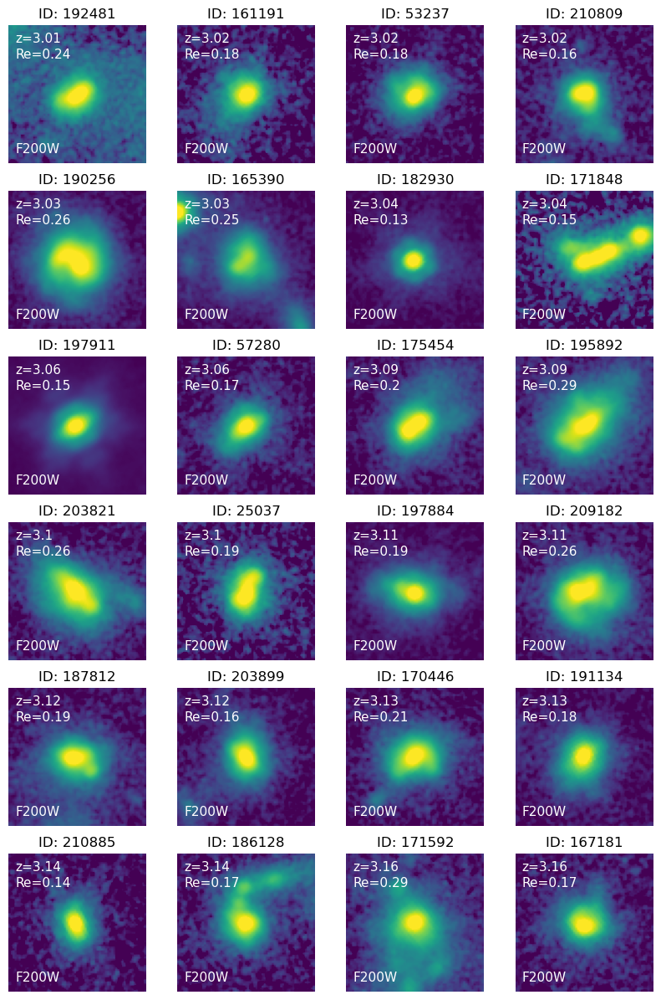

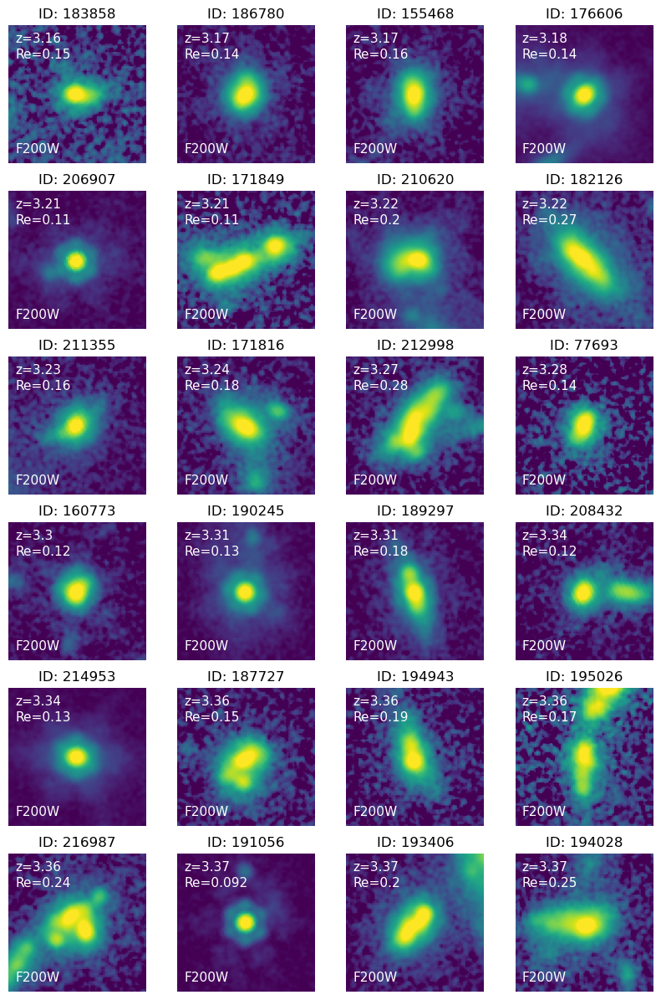

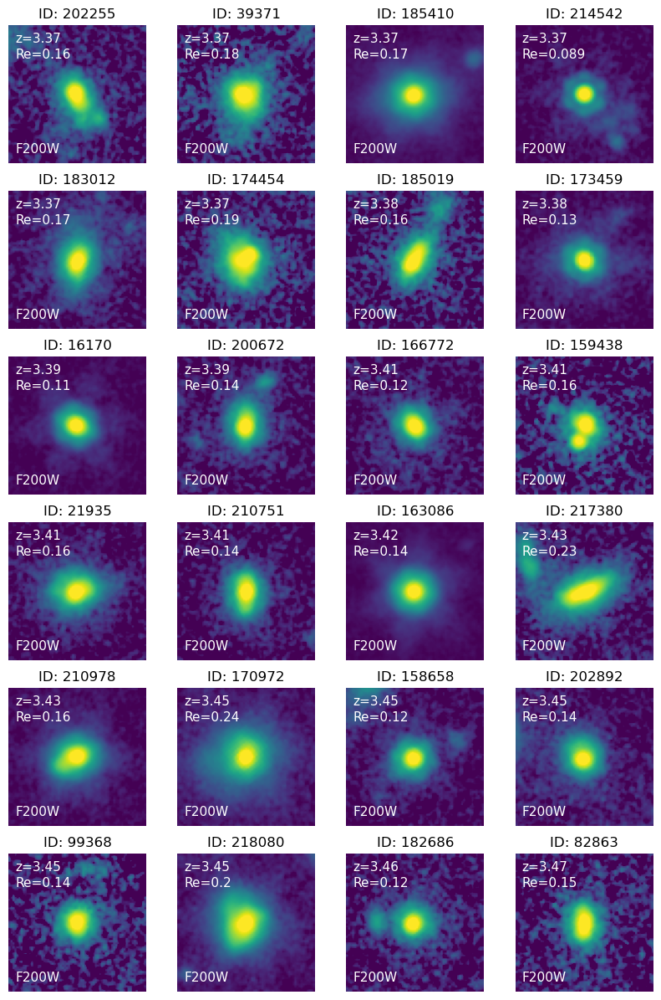

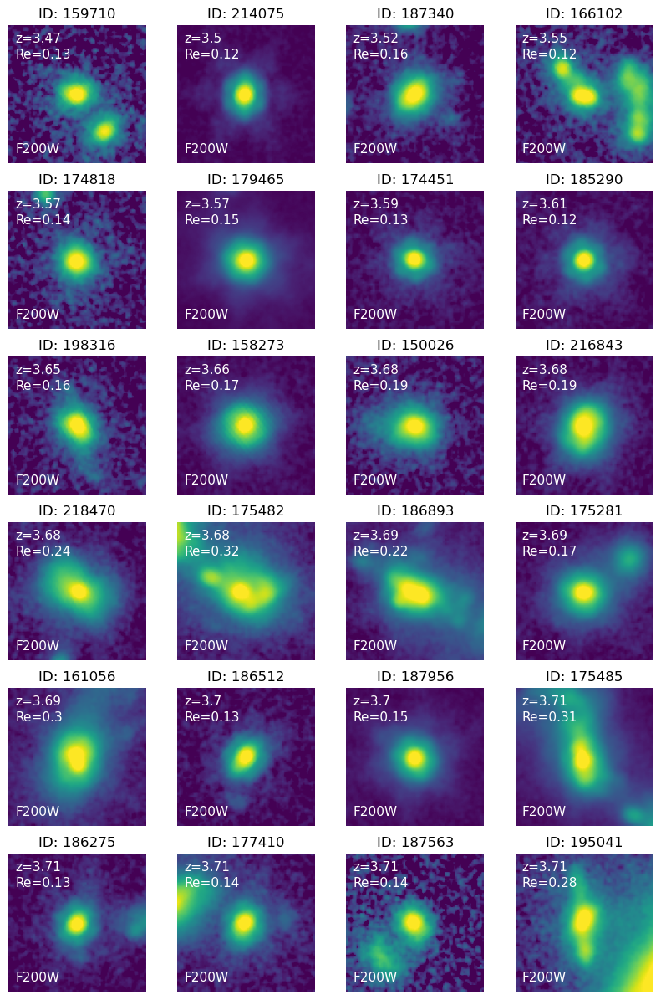

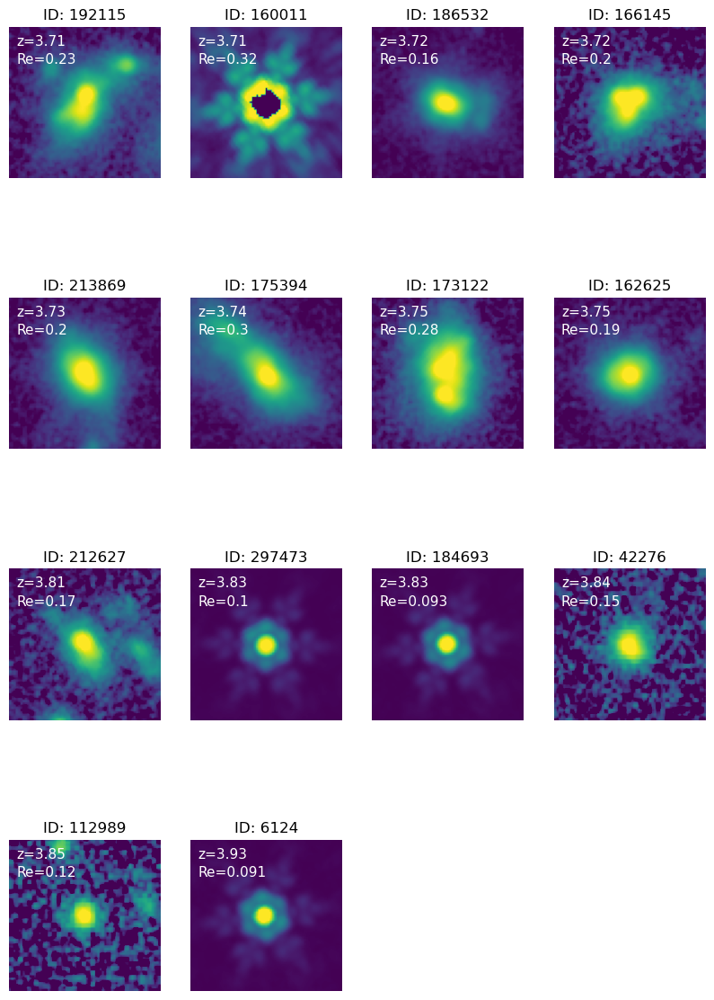

In [9]:
it=0

with PdfPages(res_dir+f'gal_cutouts_F444W.pdf') as pdf:
    
    fig=plt.figure(figsize=(10,15))
    n=0
    
    for file in cuts[0:24]:
        n=n+1
        ax = fig.add_subplot(6,4,n)
        
        #data from file:
        image=cuts_dir_2+f"{file}"
        hdu_image=fits.open(image)
    
        #data to put in text:
        rs=table_final['z'][it]
        r=table_final['Re_F444W'][it]
        gid=table_final['ID'][it]

        #normalization of data:
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=11, color='white')
        ax.text(0.05, 0.95, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.83, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.15, f'F200W', transform=ax.transAxes, **text_kwargs)

        it=it+1

    pdf.savefig(bbox_inches="tight")
    
    n=0
    fig=plt.figure(figsize=(10,15))
    for file in cuts[24:48]:
    
        n=n+1
        ax = fig.add_subplot(6,4,n)
        
        #data from file:
        image=cuts_dir_2+f"{file}"
        hdu_image=fits.open(image)
    
        #data to put in text:
        rs=table_final['z'][it]
        r=table_final['Re_F444W'][it]
        gid=table_final['ID'][it]

        #normalization of data:
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=11, color='white')
        ax.text(0.05, 0.95, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.83, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.15, f'F200W', transform=ax.transAxes, **text_kwargs)
        
        it=it+1
    
    pdf.savefig(bbox_inches="tight")

    n=0
    fig=plt.figure(figsize=(10,15))
    for file in cuts[48:72]:
    
        n=n+1
        ax = fig.add_subplot(6,4,n)
        
        #data from file:
        image=cuts_dir_2+f"{file}"
        hdu_image=fits.open(image)
    
        #data to put in text:
        rs=table_final['z'][it]
        r=table_final['Re_F444W'][it]
        gid=table_final['ID'][it]

        #normalization of data:
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=11, color='white')
        ax.text(0.05, 0.95, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.83, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.15, f'F200W', transform=ax.transAxes, **text_kwargs)
        
        it=it+1
    
    pdf.savefig(bbox_inches="tight")

    n=0
    fig=plt.figure(figsize=(10,15))
    for file in cuts[72:96]:
    
        n=n+1
        ax = fig.add_subplot(6,4,n)
        
        #data from file:
        image=cuts_dir_2+f"{file}"
        hdu_image=fits.open(image)
    
        #data to put in text:
        rs=table_final['z'][it]
        r=table_final['Re_F444W'][it]
        gid=table_final['ID'][it]

        #normalization of data:
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=11, color='white')
        ax.text(0.05, 0.95, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.83, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.15, f'F200W', transform=ax.transAxes, **text_kwargs)
        
        it=it+1
    
    pdf.savefig(bbox_inches="tight")

    n=0
    fig=plt.figure(figsize=(10,15))
    for file in cuts[96:111]:
    
        n=n+1
        ax = fig.add_subplot(4,4,n)
        
        #data from file:
        image=cuts_dir_2+f"{file}"
        hdu_image=fits.open(image)
    
        #data to put in text:
        rs=table_final['z'][it]
        r=table_final['Re_F444W'][it]
        gid=table_final['ID'][it]

        #normalization of data:
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=11, color='white')
        ax.text(0.05, 0.95, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.83, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        
        it=it+1
    
    pdf.savefig(bbox_inches="tight")

## 1.2. Choosing the candidates for barred galaxies:

We start by importing the classifications done by the three of us and combine it into one matrix. Each matrix containing each classification will be going through some tests in order to assure that there were no mistakes while classifying.

In [76]:
df1=pd.read_excel(res_dir+'visual_classification_CC.xlsx', sheet_name='Sheet1', header=0, index_col=0)
df2=pd.read_excel(res_dir+'visual_classification_LC.xlsx', sheet_name='Sheet1', header=0, index_col=0)
df3=pd.read_excel(res_dir+'visual_classification_LA.xlsx', sheet_name='Sheet1', header=0, index_col=0)

#testing:
df_list=[df1,df2,df3]
list=1

for df in df_list:
    num_rows, num_cols = df.shape
    for row in range(num_rows):
        
        #first test: are all numbers in the matrix = 0 or 1?
        for col in range(num_cols):
            value=df.iloc[row,col]
            if value != 0 and value != 1:
                print(f"FLAG: In data frame {df}, there's a wrong value in position {row},{col}")
        
        #second test: the sum of the first 4 columns has to be =1 for each row/galaxy
        sum_cols = df[['Is it elliptical?', 'Is it a disk?','Is it irregular?','Is it unresolved?']].sum(axis=1)
        value=sum_cols.iloc[row,]
        if value != 1:
            print(f"FLAG: In data frame {df}, galaxy in row {row} is wrongly classified")

        #thrid test: 5th column can only be = 1 if second column is also = 1
        value1=df.iloc[row,4]
        value2=df.iloc[row,1]
        if value1 == 1 and value2 != 1:
            print(f"FLAG: In data frame {list}, galaxy in row {row} is classified as having a bar but NOT being a disk galaxy")
    list+=1

FLAG: In data frame 2, galaxy in row 91 is classified as having a bar but NOT being a disk galaxy


In [189]:
print(df2.iloc[91,])

Is it elliptical?                                  0
Is it a disk?                                      0
Is it irregular?                                   1
Is it unresolved?                                  0
Does it have a bar?                                1
Is the morphology different between both bands?    0
Name: 175485, dtype: int64


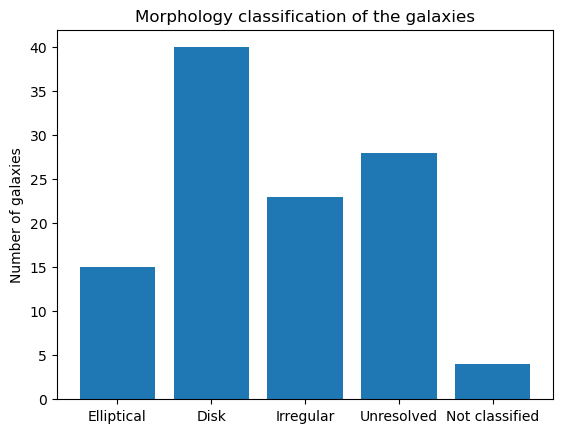

In [181]:
df_sum=df1+df2+df3

#firstly we see how many of each type of galaxy there are; a galaxy is classified of being of one morphology
#if it has 2 or more votes into that morphology; for galaxies being classified as three different 
#morphologies, we create a new class called not_classified

elliptical=0
disk=0
irregular=0
unresolved=0
not_classified=0

max_val_l=[]
max_loc_l=[]

# Iterate through each row of the DataFrame
for index, row in df_sum.iterrows():
    # Find the maximum value in the row
    max_val = row[:4].max()
    # Find the index (column name) where the maximum value occurs
    max_loc = row[:4].idxmax()

    if max_val == 1:
        not_classified+=1
    elif max_val>1 and max_loc == 'Is it elliptical?':
        elliptical+=1
    elif max_val>1 and max_loc == 'Is it a disk?':
        disk+=1
    elif max_val>1 and max_loc == 'Is it irregular?':
        irregular+=1
    elif max_val>1 and max_loc == 'Is it unresolved?':
        unresolved+=1

total_gal=elliptical+disk+irregular+unresolved+not_classified
if total_gal != 110:
    print("FLAG: There was a mistake in labeling the classification of galaxies")

#making a bar plot of the data:
fig, ax = plt.subplots()

morphologies = ['Elliptical', 'Disk', 'Irregular', 'Unresolved', 'Not classified']
counts = [elliptical, disk, irregular, unresolved, not_classified]

ax.bar(morphologies, counts)

ax.set_ylabel('Number of galaxies')
ax.set_title('Morphology classification of the galaxies')

plt.show()

There are in total 30 galaxies classified as being barred; 7 of those are very strongly barred (they have been classified by all 3 of us as having a bar), 14 of those are strongly barred (they have been classified by 2 of us as having a bar), 9 of those are classified as weakly barred (only classified by one person as being barred).


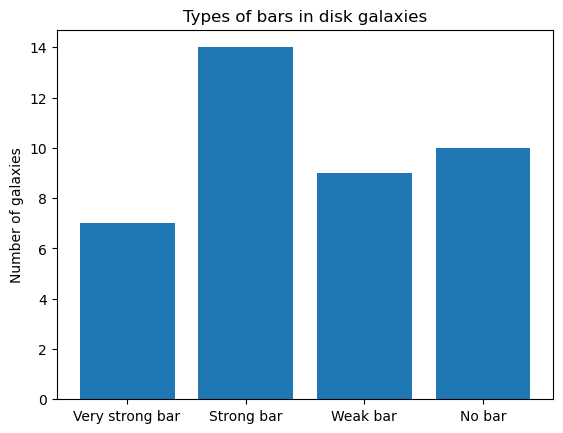

In [192]:
#now, we are going to see how many (and which) disk galaxies have also been classified as having a bar

barred_gal=0
strong_bar=0
very_strong_bar=0
gal_list=[]
gal_list_vsb=[]

num_rows, num_cols = df_sum.shape
for row in range(num_rows):
    disk_gal=df_sum.iloc[row,1]
    bar=df_sum.iloc[row,4]
    if disk_gal>1 and bar>0:
        barred_gal+=1
        row_name = df_sum.index[row]
        gal_list.append(row_name)
        if bar>1 and bar <3:
            strong_bar+=1
        elif bar==3:
            row_name = df_sum.index[row]
            gal_list_vsb.append(row_name)
            very_strong_bar+=1

weak_bar=barred_gal-strong_bar-very_strong_bar
no_bar=disk-barred_gal
print(f"There are in total {barred_gal} galaxies classified as being barred; {very_strong_bar} of those are very strongly barred (they have been classified by all 3 of us as having a bar), {strong_bar} of those are strongly barred (they have been classified by 2 of us as having a bar), {weak_bar} of those are classified as weakly barred (only classified by one person as being barred).")

#making a bar plot of the data:
fig, ax = plt.subplots()

bar_type = ['Very strong bar', 'Strong bar', 'Weak bar', 'No bar']
counts = [very_strong_bar, strong_bar, weak_bar, no_bar]

ax.bar(bar_type, counts)

ax.set_ylabel('Number of galaxies')
ax.set_title('Types of bars in disk galaxies')

plt.show()

In [193]:
gal_list_vsb

[192481, 203821, 210885, 155468, 210751, 82863, 175485]

In [95]:
#we create a new excel document with the total visual classification:
df_sum=table_excel.to_pandas()
df_sum.to_excel(res_dir+'visual_classification_all.xlsx', index=False)

Upon visual classification of these 110 galaxies, we select the following as possible candidates for barred galaxies: 210885, 155468, 171816, 203899, 183012, 175485, 210751, 57280, 203821, 187340, 192481, 82863, 182126, 197911.

We now create an array with these IDs to further analyze the galaxies:

In [10]:
gal_id_list=[210885, 155468, 171816, 203899, 183012, 175485, 210751, 57280, 203821, 187340, 192481, 82863, 
             182126, 197911]

# 2. Spectroscopic redshift:

Firstly, we're going to check if there is available spectroscopic redshift for the galaxies selected.

In [11]:
obs_dir=f'observations/'

#loading JADES data:
data_jades=obs_dir+f'hlsp_jades_jwst_nirspec_goods-s-deephst_clear-prism_line-fluxes_v1.0_catalog.fits'

#opening extensions 9 (redshifts), 2 (coordinates), 3 (half-light radius or effective radius)
#and 5 (flux in nJy):
with fits.open(data_jades) as hdul:
    header_z=hdul[1].header
    data_z=hdul[1].data

spec_z=data_z['z_Spec']
spec_list=data_z['NIRCam_ID']

z_spec=[]
id_spec=[]

for gal_id in gal_id_list:
    for i in range(len(spec_list)):
        if spec_list[i]==gal_id:
            z_spec.append(spec_z[i])
            id_spec.append(spec_list[i])

print(f"There are {len(id_spec)} galaxies with spectroscopic redshifts.")

There are 0 galaxies with spectroscopic redshifts.


There are no available spectroscopic redshifts for the selected galaxies. Finally, we make a table from the galaxy list, with the ID, coordinates and redshift of the selected galaxies:

In [12]:
gal_id=[]
ra=[]
dec=[]
z=[]

for gal in gal_id_list:
    for i in range(len(table_final['ID'])):
        if table_final['ID'][i]==gal:
            gal_id.append(table_final['ID'][i])
            ra.append(table_final['RA'][i])
            dec.append(table_final['DEC'][i])
            z.append(table_final['z'][i])

gal_list_table=Table()
gal_list_table['ID']=gal_id
gal_list_table['RA']=ra
gal_list_table['DEC']=dec
gal_list_table['z']=z

gal_list_table_final=gal_list_table[np.argsort(gal_list_table['z'])]

gal_list_table_final.write(res_dir+f"gal_visual_class_list.ecsv",overwrite=True)

In [13]:
#We also have to make a table with only ID, RA and DEC to use in script make_postage_stamps to get those 14
#galaxies in all filters:

cut_list_table=Table()
cut_list_table['ID']=gal_list_table['ID']
cut_list_table['RA']=gal_list_table['RA']
cut_list_table['DEC']=gal_list_table['DEC']

cut_list_table.write(res_dir+f"gal_visual_class_list_cut.ecsv",overwrite=True,format="ascii.fast_no_header")

In [14]:
time_end = datetime.now()
print(f"Initial time...: {time_ini}")
print(f"Final time.....: {time_end}")
print(f"Excecution time: {time_end-time_ini}")

Initial time...: 2024-02-08 14:02:08.915179
Final time.....: 2024-02-08 14:03:01.405622
Excecution time: 0:00:52.490443
